# Data-Driven Innovation Challenge

# DermaTrace: Deep Learning–Based Skin Image Classification for Eczema and Atopic Dermatitis

## Introduction:

Recent advances in deep learning have enabled automated assessment of eczema severity from skin images, offering potential support for clinical decision-making and teledermatology. One influential approach in this domain is EczemaNet, a convolutional neural network designed to classify eczema severity from real-world photographs: https://www.eczemanet.co.uk/
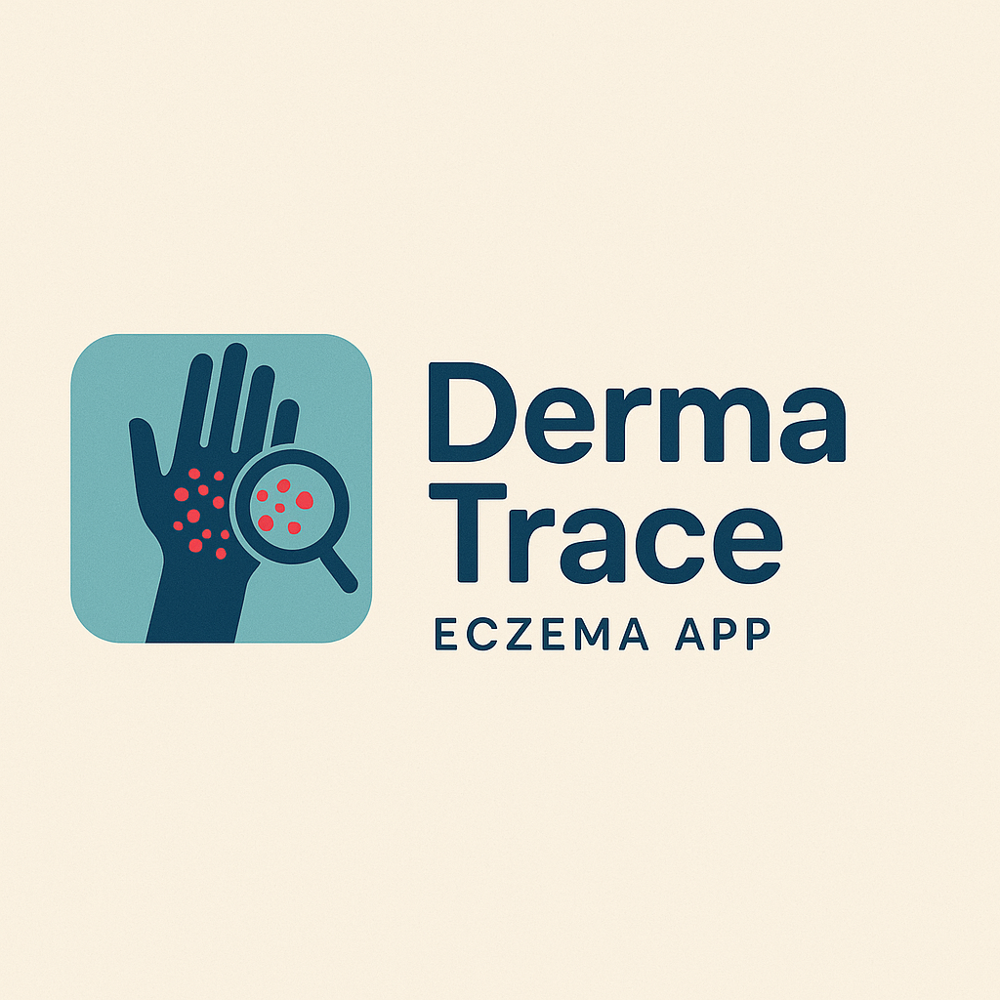

However, EczemaNet itself is a **research benchmark rather than a publicly reusable model**: the original training data and pretrained weights are not openly available. As a result, its methodology cannot be directly reproduced or deployed without reimplementation. Moreover, prior research highlights that dermatological AI systems may exhibit reduced robustness across diverse skin tones, as visual indicators such as redness can be less pronounced in darker skin, raising concerns around fairness and generalizability.

In this project, DermaTrace an independently trained CNN model inspired by the EczemaNet methodology is implemented and evaluated. Rather than reproducing the original EczemaNet severity scoring task, the focus is placed on binary classification of two closely related skin conditions: **eczema and atopic dermatitis (AD)**. The project investigates model behavior, misclassification patterns, and targeted fine-tuning strategies to improve robustness in the different subtype classes.

## Goal of this Challenge
The goal of this challenge is to classify two dermatological subtypes, eczema and atopic dermatitis, using an image-based CNN model, and to evaluate how targeted fine-tuning strategies such as class weighting and decision threshold adjustment affect model performance and error behavior.

## Objectives

- Implement a CNN-based image classification model inspired by the EczemaNet approach

- Prepare and preprocess a labeled image dataset for binary classification (eczema vs AD)

- Evaluate baseline model performance using appropriate metrics

- Analyze misclassifications and confidence patterns in model predictions

- Apply targeted fine-tuning strategies, including class weighting and threshold tuning

- Reflect on model limitations, robustness, and directions for future improvement

## Scope

This project focuses on model evaluation and incremental improvement, rather than reproducing or deploying the original EczemaNet system. Due to the absence of publicly available EczemaNet training data and pretrained weights, the analysis is limited to an independently trained model inspired by the EczemaNet methodology.

# Before we begin: What will this notebook contains?

This notebook documents the first step of a data-driven innovation challenge focused on evaluating and improving an EczemaNet-inspired image classification model.

The notebook is structured as follows:

- **Project Context and Goals** : Overview of the classification task, motivation, and scope of the challenge.

- **Model Overview** : Description of the CNN architecture and its inspiration from EczemaNet-style dermatological image analysis.

- **Data Preparation and Preprocessing** : Explanation of the dataset, train–test split, preprocessing steps, and label structure.

- **Baseline Model Evaluation**: Evaluation of initial model performance using standard classification metrics.

- **Misclassification Analysis** : Analysis of incorrect predictions, confidence scores, and observed error patterns.

- **Fine-Tuning Experiments**: Application and evaluation of class weighting and threshold tuning as targeted improvement strategies.

- **Discussion and Future Work**: Reflection on results, limitations, and recommendations for future model development.



# 1. Imports and Setups

In this step, I'm importing all the libraries I’ll need for image preprocessing, model building, training, and visualization. I’m also setting up API access for environmental data.

In [ ]:
# 1. Imports and Setup
import os
from glob import glob
import numpy as np
import pandas as pd
import random
from PIL import Image
from tqdm import tqdm
from pathlib import Path
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, accuracy_score
import numpy as np
import cv2
import requests
import json

# 2. Retrieve the EczemaNet Repository

In this step, the EczemaNet repository is retrieved and inspected to understand the reference methodology and model architecture design proposed in prior research. The purpose of this step is not to directly use or train the original EczemaNet model, but to analyze how the system is structured, which architectures are provided, and how training pipelines are organized:


In [ ]:
# Clone the existing github repository and analyze the folders
!git clone https://github.com/Tanaka-Group/EczemaNet.git

Cloning into 'EczemaNet'...
remote: Enumerating objects: 537, done.
remote: Counting objects: 100% (537/537), done.
remote: Compressing objects: 100% (341/341), done.
remote: Total 537 (delta 192), reused 533 (delta 190), pack-reused 0 (from 0)
Receiving objects: 100% (537/537), 16.93 MiB | 35.31 MiB/s, done.
Resolving deltas: 100% (192/192), done.


In [ ]:
# All the folders listed in the
os.listdir("EczemaNet")

['README.md',
 'LICENSE',
 'notebooks',
 'environment.yml',
 'lib',
 '.git',
 'eczemanet_models',
 'py_scripts']

In [ ]:
%cd EczemaNet

/content/EczemaNet


In [ ]:
# Display the README.md and understand the assessment
!sed -n '1,200p' README.md

# EczemaNet: Automating Detection and Severity Assessment of Atopic Dermatitis

Atopic dermatitis (AD), also known as eczema, is one of the most common chronic skin diseases. AD severity is primarily evaluated based on visual inspections by clinicians, but is subjective and has large inter- and intra-observer variability in many clinical study settings.

To aid the standardisation and automating the evaluation of AD severity, a CNN computer vision pipeline that first detects areas of AD from photographs, and then makes probabilistic predictions on the severity of the disease is developed. EczemaNet combines transfer and multitask learning, ordinal classification, and ensembling over crops to make its final predictions. EczemaNet was tested using a set of images acquired in a published clinical trial, and demonstrate low RMSE with well-calibrated prediction intervals. The effectiveness of using CNNs for non-neoplastic dermatological diseases with a medium-size dataset, and their potenti

The EczemaNet repository describes a CNN-based approach for analyzing atopic dermatitis from skin images, but because the training data and pretrained weights are not publicly available, it is mainly used as a reference rather than a model that can be directly applied.

In [ ]:
# Inspect model architectures that the project provide
os.listdir("eczemanet_models")

['EczemaNet_VGG19.py',
 'EczemaNet_MobileNet_SD.py',
 'EczemaNet_MobileNet.py',
 'EczemaNet_ResNet50.py',
 'EczemaNet_InceptionV3.py',
 'EczemaNet_MobileNet_Init.py',
 'EczemaNet_VGG16.py',
 'EczemaNet_VGG16_SD.py',
 'EczemaNet_VGG16_Init.py']

In [ ]:
# Identify inference script
os.listdir("py_scripts")

['Model_Training-EczemaNet_ASD.py',
 'Model_Training-Baseline_Manual.py',
 'README.md',
 'Model_Training-Baseline_Univariate-Regression-SCORAD.py',
 'Model_Training-EczemaNet_ResNet50.py',
 'Model_Training-EczemaNet_SD.py',
 'Model_Training-Baseline_Init.py',
 'Model_Training-Baseline_Whole_Image-Univariate-Regression-SCORAD.py',
 'Model_Training-EczemaNet_VGG19.py',
 'Model_Training-Baseline_Categorical.py',
 'Model_Training-EczemaNet_MobileNet.py',
 'Model_Training-Baseline_Whole_Image.py',
 'Model_Training-Baseline_Univariate-SASSAD.py',
 'Model_Training-Baseline_Univariate-SCORAD.py',
 'Model_Training-Baseline_Univariate-EASI.py',
 'Model_Training-EczemaNet.py',
 'Model_Training-EczemaNet_InceptionV3.py',
 'Model_Training-EczemaNet_FSD.py',
 'Model_Training-Baseline_Whole_Image-Univariate-Regression-SASSAD.py',
 'Model_Training-Baseline_Whole_Image-Univariate-Regression-EASI.py',
 'Model_Training-Baseline_Univariate-Regression-SASSAD.py',
 'Model_Training-Baseline_Univariate-Regres

The inspection of the repository shows that EczemaNet mainly provides model architectures and training scripts, but since the original data and trained weights are not publicly available, the models cannot be run directly **and are used only as a reference for this project.**

In [ ]:
# Search in the repo for weight files
!find . -type f \( -name "*.h5" -o -name "*.keras" -o -name "*.ckpt" -o -name "*.pth" -o -name "*.pt" -o -name "*.pkl" \) | head -n 50

In [ ]:
# Search for the code to load weights
!grep -Rni "load_weights\|load_model\|weights\|checkpoint" . | head -n 40

./notebooks/Model Training.ipynb:157:    "    classWeights = {}\n",
./notebooks/Model Training.ipynb:173:    "    # Class weights (Balancing classes):\n",
./notebooks/Model Training.ipynb:177:    "            classWeights[branch+\"_\"+str(idx)+\"_output\"] = weight_ratio(col)\n",
./notebooks/Model Training.ipynb:186:    "    model_fn = os.path.join(OUTPUT_PATH, str(today_str) + \"_run-\" + str(run) + \"_model_weights.h5\")\n",
./notebooks/Model Training.ipynb:201:    "        classWeights = classWeights,\n",
./notebooks/Model Training.ipynb:217:    "    model.save_weights(model_fn)\n",
./lib/object_detection/export_tflite_ssd_graph_lib.py:75:      checkpoint
./lib/object_detection/export_tflite_ssd_graph_lib.py:151:                        trained_checkpoint_prefix,
./lib/object_detection/export_tflite_ssd_graph_lib.py:168:    trained_checkpoint_prefix: a file prefix for the checkpoint containing the
./lib/object_detection/export_tflite_ssd_graph_lib.py:277:    moving_average_checkpoint

In [ ]:
# Read the script README inside py_scripts
!sed -n '1,200p' py_scripts/README.md


## Pre-trained model comparisons

- **EczemaNet_VGG16**: Full-suite EczemaNet with pretrained [VGG16](https://arxiv.org/pdf/1409.1556.pdf) (ImageNet) as feature extractor. (# of parameters: 138,357,544)
- **EczemaNet_VGG19**: Full-suite EczemaNet with pretrained [VGG19](https://arxiv.org/pdf/1409.1556.pdf) (ImageNet) as feature extractor. (# of parameters: 143,667,240)
- **EczemaNet_ResNet50**:  Full-suite EczemaNet with pretrained [ResNet50](https://arxiv.org/abs/1512.03385) (ImageNet) as feature extractor. (# of parameters: 25,636,712)
- **EczemaNet_MobileNet**: Full-suite EczemaNet with pretrained [MobileNet](https://arxiv.org/abs/1704.04861) (ImageNet) as feature extractor. (# of parameters: 4,253,864)
- **EczemaNet_InceptionV3**: Full-suite EczemaNet with pretrained [InceptionV3](https://arxiv.org/abs/1512.00567) (ImageNet) as feature extractor. (# of parameters: 23,851,784)

---

## Eczemanet Model training and Sign dependence study

- **EczemaNet**:  Full-suite EczemaNet with p

In their README, “pre-trained” refers to ImageNet-pretrained backbones (VGG/ResNet/MobileNet), not pretrained eczema severity weights. So then our baseline will be:
Training  an EczemaNet architecture on our dataset, then do misclassification analysis + targeted fine-tuning using class weights + threshold adjustment.

In [ ]:
# Before running training: inspect that script for required inputs
!sed -n '1,200p' py_scripts/Model_Training-EczemaNet_MobileNet.py

#!/usr/bin/env python
# coding: utf-8

# # Model Training: EczemaNet_VGG16 Full-suite

# In[ ]:


import sys
sys.path.append("..")
sys.path.append("../lib")

import os
import pandas as pd
import numpy as np
import pickle
from tqdm import tqdm
import itertools
from datetime import datetime

import matplotlib.pyplot as plt
import scikitplot as skplt
import scipy
from scipy import ndimage

from sklearn.metrics import accuracy_score, f1_score, log_loss
from sklearn.calibration import calibration_curve
from sklearn.metrics import (brier_score_loss, precision_score, recall_score)
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from sklearn.utils import class_weight
from math import sqrt

import keras
from keras.models import m

This training script defines a complete EczemaNet-style training pipeline using a MobileNet backbone. It loads image data and labels, applies cross-validation with class weighting to handle imbalance, and trains the model with early stopping. After training, the script evaluates predictions, saves performance metrics, and exports the trained model and results.

In [ ]:
# Import tensorflow
!python -c "import tensorflow as tf; print('TF version:', tf.__version__)"

2026-01-20 11:05:20.030815: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1768907120.056227    4326 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1768907120.063913    4326 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1768907120.081996    4326 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1768907120.082085    4326 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1768907120.082091    4326 computation_placer.cc:177] computation placer alr

Since no pretrained eczema weights are available, the model is trained on our own dataset. Each image is assigned a single label, either eczema or atopic dermatitis (AD), which simplifies the original EczemaNet approach and fits within the scope of this challenge.

# 2. Load and Preprocess Image Data

Here I’m loading eczema skin images from a public dataset (like DermNetNZ) and my own labeled photos. I’ll use ImageDataGenerator to normalize the images and split them into training and validation sets. This prepares the data for the CNN and helps prevent overfitting.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Load the based directory of the testing folder
base_dir = "/content/drive/MyDrive/datasets/DermaTrace/DermNet"

In [ ]:
# Take a look inside the folder and how many photos/picture each folder content:
CLASS_FOLDERS = {
    "eczema": "Eczema Photos",
    "atopic_dermatitis": "Atopic Dermatitis Photos"
}

def is_image(fp):
    return fp.lower().endswith((".jpg", ".jpeg", ".png", ".webp"))

def count_images(folder):
    files = glob(os.path.join(folder, "**", "*"), recursive=True)
    return sum(1 for f in files if os.path.isfile(f) and is_image(f))

print("📁 Dataset root:", base_dir)
print("✅ Exists:", os.path.exists(base_dir))
print("\n📊 DATASET OVERVIEW\n")

for split in ["train", "test"]:
    print(f"📂 {split.upper()}")
    for label, subfolder in CLASS_FOLDERS.items():
        folder = os.path.join(base_dir, split, subfolder)
        if os.path.exists(folder):
            n = count_images(folder)
            print(f"   📁 {subfolder}")
            print(f"      └── 🖼️  {n} images")
        else:
            print(f"   ❌ {subfolder} (not found)")
    print("")

📁 Dataset root: /content/drive/MyDrive/datasets/DermaTrace/DermNet
✅ Exists: True

📊 DATASET OVERVIEW

📂 TRAIN
   📁 Eczema Photos
      └── 🖼️  1235 images
   📁 Atopic Dermatitis Photos
      └── 🖼️  489 images

📂 TEST
   📁 Eczema Photos
      └── 🖼️  309 images
   📁 Atopic Dermatitis Photos
      └── 🖼️  123 images



### Dataset Structure Overview

The dataset is organised into predefined training and test splits, each containing two diagnosis-based classes:
**Eczema** and **Atopic Dermatitis**. This structure is preserved throughout the project to ensure reproducibility
and to avoid unintended data leakage.

A summary of the dataset shows that both classes are present in the training and test sets, with a higher number of
eczema images compared to atopic dermatitis images. This class imbalance is noted and will be considered in later
stages of the analysis and modeling process.


In [ ]:
#Then print how many images were found in each folder:
def is_image(fp):
    return fp.lower().endswith((".jpg", ".jpeg", ".png", ".webp"))

def show_random_images(split, label, n=8):
    folder = os.path.join(base_dir, split, CLASS_FOLDERS[label])
    images = [f for f in glob(os.path.join(folder, "**", "*"), recursive=True)
              if os.path.isfile(f) and is_image(f)]

    samples = random.sample(images, min(n, len(images)))

    plt.figure(figsize=(16, 4))
    for i, fp in enumerate(samples):
        img = Image.open(fp)
        plt.subplot(1, len(samples), i + 1)
        plt.imshow(img)
        plt.axis("off")
    plt.suptitle(f"{split.upper()} — {label.replace('_',' ').title()}", fontsize=14)
    plt.show()

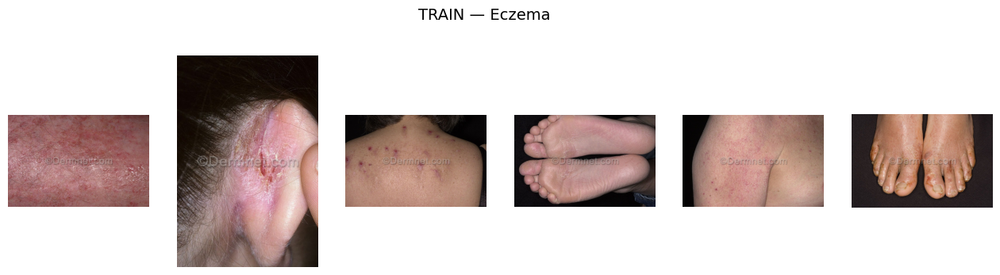

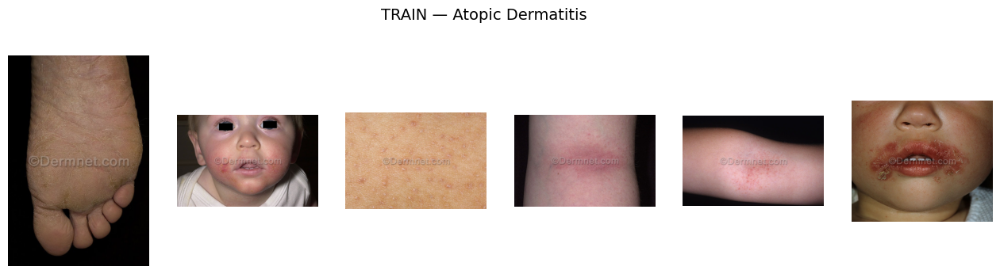

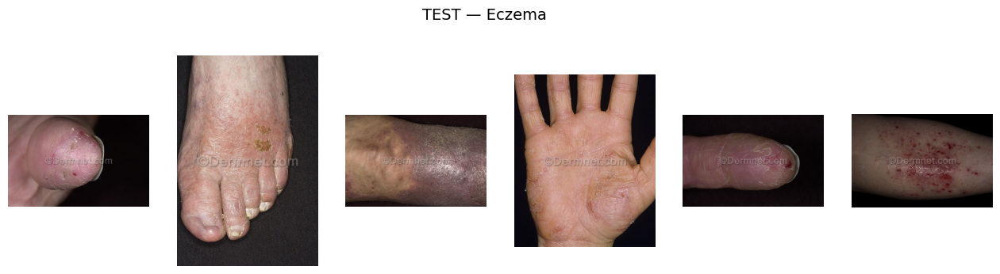

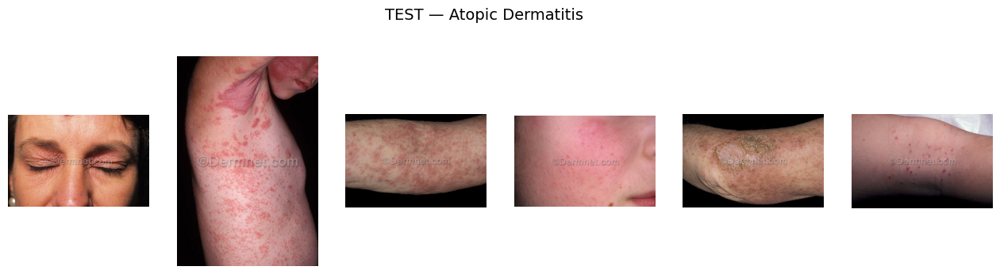

In [ ]:
# Show random training subfolder images from Atopic Dermatitis and Eczema:
show_random_images("train", "eczema", n=6)
show_random_images("train", "atopic_dermatitis", n=6)

# Show random test subfolder images from Atopic Dermatitis and Eczema:
show_random_images("test", "eczema", n=6)
show_random_images("test", "atopic_dermatitis", n=6)


### Visual Inspection Reflection

A visual inspection of the training images reveals that **atopic dermatitis and eczema share highly similar visual characteristics**, making the classification task inherently challenging. In both classes, common features such as erythema (redness), dryness, scaling, and inflamed skin regions are observed across a wide range of anatomical locations, including the face, arms, hands, legs, and behind the ears.

The dataset contains images of **both adults and children**, with noticeable variation in age, body parts, and image framing (close-up lesion views versus larger body-area views). This heterogeneity increases the complexity of the task, as the model must learn disease-related patterns rather than relying on contextual cues such as age or location alone.

Additionally, variation in **skin tone, lighting conditions, and background** is visible across the samples. While this diversity is beneficial for building a more generalizable model, it also introduces potential challenges, as redness and inflammation may present differently across skin tones. This observation is particularly relevant to the broader research goal of improving robustness and fairness in dermatological image analysis.

Overall, the visual overlap between eczema and atopic dermatitis, combined with demographic and photographic variability, suggests that misclassifications are likely to occur and may be driven by subtle visual differences rather than clear diagnostic boundaries. This makes the dataset suitable for later analysis of model errors and subgroup performance, which aligns with the long-term objective of improving severity assessment across diverse populations.

After this step we are going to analyze further the dataset from image resizin to eczema and atopic dermatitis classification.


In [ ]:
# Collect basic image properties (sizes & aspect ratios)
base_dir = "/content/drive/MyDrive/datasets/DermaTrace/DermNet"

CLASS_FOLDERS = {
    "eczema": "Eczema Photos",
    "atopic_dermatitis": "Atopic Dermatitis Photos"
}

def is_image(fp):
    return fp.lower().endswith((".jpg", ".jpeg", ".png", ".webp"))

rows = []

for split in ["train", "test"]:
    for label, subfolder in CLASS_FOLDERS.items():
        folder = os.path.join(base_dir, split, subfolder)
        for fp in glob(os.path.join(folder, "**", "*"), recursive=True):
            if os.path.isfile(fp) and is_image(fp):
                try:
                    img = Image.open(fp)
                    w, h = img.size
                    rows.append({
                        "split": split,
                        "label": label,
                        "filepath": fp,
                        "width": w,
                        "height": h,
                        "aspect_ratio": w / h
                    })
                except:
                    pass

img_df = pd.DataFrame(rows)
print("Images collected:", len(img_df))
img_df.head()

Images collected: 2156


,split,label,filepath,width,height,aspect_ratio
0,train,eczema,/content/drive/MyDrive/datasets/DermaTrace/Der...,477,720,0.662500
1,train,eczema,/content/drive/MyDrive/datasets/DermaTrace/Der...,477,720,0.662500
2,train,eczema,/content/drive/MyDrive/datasets/DermaTrace/Der...,720,610,1.180328
3,train,eczema,/content/drive/MyDrive/datasets/DermaTrace/Der...,477,720,0.662500
4,train,eczema,/content/drive/MyDrive/datasets/DermaTrace/Der...,720,472,1.525424


The images show substantial variation in resolution, with widths and heights ranging roughly between 450 and 720 pixels, indicating heterogeneous image sources and framing.

In [ ]:
# Summarize image sizes
img_df.groupby(["split", "label"])[["width", "height"]].describe()

width                                               \
                          count        mean         std    min    25%    50%   
split label                                                                    
test  atopic_dermatitis   123.0  652.780488  109.276273  468.0  486.0  720.0   
      eczema              309.0  644.656958  111.435959  464.0  480.0  720.0   
train atopic_dermatitis   489.0  653.196319  106.652465  456.0  489.0  720.0   
      eczema             1235.0  642.788664  111.941572  418.0  480.0  720.0   

                                       height                                 \
                           75%    max   count        mean         std    min   
split label                                                                    
test  atopic_dermatitis  720.0  720.0   123.0  543.504065  109.731518  461.0   
      eczema             720.0  720.0   309.0  556.834951  117.785031  460.0   
train atopic_dermatitis  720.0  720.0   489.0  548.672802  111.132671  452.0   
      eczema             720.0  720.0  1235.0  556.660729  114.549052  458.0   

                                                      
                           25%    50%    75%     max  
split label                                           
test  atopic_dermatitis  472.0  480.0  720.0   720.0  
      eczema             472.0  480.0  720.0  1080.0  
train atopic_dermatitis  472.0  480.0  720.0   720.0  
      eczema             472.0  480.0  720.0   720.0

Both the train and test sets exhibit similar resolution statistics across eczema and atopic dermatitis classes, suggesting that the predefined split does not introduce major resolution-related bias.

In [ ]:
# Aspect ratio analysis
img_df.groupby(["split", "label"])["aspect_ratio"].describe()

count      mean       std       min       25%  50%  \
split label                                                                    
test  atopic_dermatitis   123.0  1.277643  0.382484  0.650000  0.675000  1.5   
      eczema              309.0  1.239431  0.394248  0.644444  0.666667  1.5   
train atopic_dermatitis   489.0  1.266845  0.379210  0.633333  0.679167  1.5   
      eczema             1235.0  1.235545  0.394650  0.638889  0.666667  1.5   

                              75%       max  
split label                                  
test  atopic_dermatitis  1.525424  1.561822  
      eczema             1.525424  1.565217  
train atopic_dermatitis  1.525424  1.592920  
      eczema             1.525424  1.572052

Aspect ratios are centered around 1.2–1.5, with moderate variability, indicating a mix of portrait and landscape images and justifying the need for standardized resizing during preprocessing.

In [ ]:
# Color statistics (for skin tone diversity)
def average_rgb(fp):
    img = Image.open(fp).convert("RGB")
    arr = np.array(img)
    return arr.mean(axis=(0,1))  # R, G, B

color_rows = []

sample_df = img_df.sample(min(300, len(img_df)), random_state=42)

for _, row in sample_df.iterrows():
    try:
        r, g, b = average_rgb(
            os.path.join(
                base_dir,
                row["split"],
                CLASS_FOLDERS[row["label"]],
                os.path.basename(row.get("filepath", ""))
            )
        )
        color_rows.append({
            "split": row["split"],
            "label": row["label"],
            "R": r, "G": g, "B": b
        })
    except:
        pass

color_df = pd.DataFrame(color_rows)
color_df.describe()

,R,G,B
count,300.000000,300.000000,300.000000
mean,127.302980,95.453541,86.845816
std,34.973984,26.815624,26.188596
min,36.920463,33.838429,32.125541
25%,102.670478,73.854489,67.815010
50%,130.136172,95.837710,85.225296
75%,152.610081,113.809271,105.066296
max,215.428293,172.035185,208.619546


The RGB statistics indicate considerable variation in color intensity across images, reflecting differences in
skin tone and illumination. This supports the need for robust preprocessing and careful interpretation of
model performance across diverse visual conditions.

Given the observed variability in image dimensions and aspect ratios, uniform resizing will be necessary to ensure consistent model input while preserving clinically relevant features.

# 3. Data Preprocessing
The results that we obtain from the images analysis shows high variability in image dimensions, aspect ratios, and color intensity, while the visual differences between classes are subtle. Given the limited dataset size, aggressive augmentation could distort clinically relevant features. Therefore, preprocessing should focus on standardizing input shape, normalizing lighting and color variations, and preserving medical details through a simple and explainable pipeline.

### Preprocessing Summary

- Resize images to 224×224 pixels  
- Normalize using ImageNet mean and standard deviation  
- Apply light data augmentation during training only  
- Preserve the predefined train–test split  
- Avoid complex preprocessing to maintain interpretability


In [ ]:
# Load the paths again before preprocessing
base_dir = "/content/drive/MyDrive/datasets/DermaTrace/DermNet"  # your dataset root

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

train_dir = os.path.join(base_dir, "train")
test_dir  = os.path.join(base_dir, "test")

print("Train dir:", train_dir, "exists:", os.path.exists(train_dir))
print("Test dir :", test_dir,  "exists:", os.path.exists(test_dir))

Train dir: /content/drive/MyDrive/datasets/DermaTrace/DermNet/train exists: True
Test dir : /content/drive/MyDrive/datasets/DermaTrace/DermNet/test exists: True


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels="inferred",
    label_mode="int",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    labels="inferred",
    label_mode="int",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False
)

class_names = train_ds.class_names
print("Class names:", class_names)

Found 1724 files belonging to 2 classes.
Found 432 files belonging to 2 classes.
Class names: ['Atopic Dermatitis Photos', 'Eczema Photos']


In [ ]:
# Define preprocessing layers (augmentation + normalization) ONLY in training dataset
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.05),      # ~ ±10 degrees
    tf.keras.layers.RandomContrast(0.1),
], name="data_augmentation")

In [ ]:
# ImageNet normalization (this is for pretrained backbones)
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [ ]:
# Apply preprocessing to datasets
AUTOTUNE = tf.data.AUTOTUNE

def preprocess_train(image, label):
    image = tf.cast(image, tf.float32)
    image = data_augmentation(image)
    image = preprocess_input(image)
    return image, label

def preprocess_test(image, label):
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)
    return image, label

train_ds_pp = train_ds.map(preprocess_train, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds_pp  = test_ds.map(preprocess_test,  num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

In [ ]:
# Quick sanity check before we process any further
for images, labels in train_ds_pp.take(1):
    print("Batch images shape:", images.shape)
    print("Batch labels shape:", labels.shape)
    print("Labels sample:", labels[:10].numpy())

Batch images shape: (32, 224, 224, 3)
Batch labels shape: (32,)
Labels sample: [1 0 1 1 1 1 1 1 1 1]


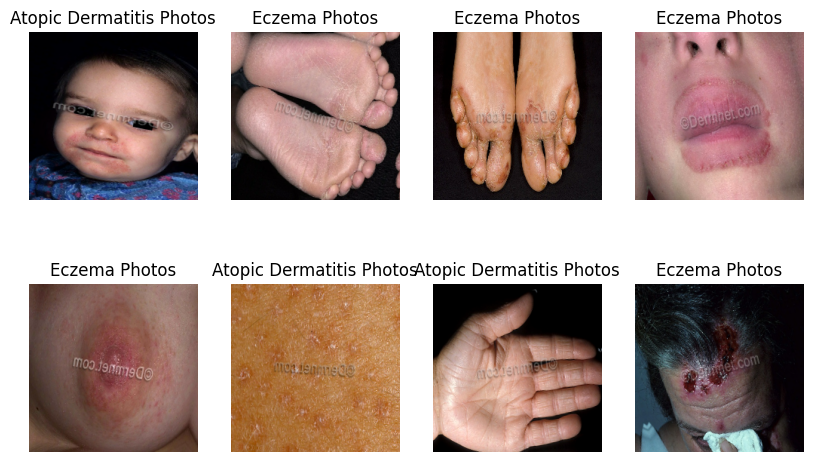

In [ ]:
# Visualize augmented samples to confirm that augmentation is not agressive
for images, labels in train_ds_pp.take(1):
    plt.figure(figsize=(10, 6))
    for i in range(8):
        ax = plt.subplot(2, 4, i + 1)
        # images are normalized; bring back to [0,1] for display roughly
        img = images[i].numpy()
        img = (img - img.min()) / (img.max() - img.min() + 1e-8)
        plt.imshow(img)
        plt.title(class_names[int(labels[i])])
        plt.axis("off")
    plt.show()

### Implemented Preprocessing

Preprocessing is applied on-the-fly using a TensorFlow data pipeline. Images are resized to 224×224 pixels at load time.
During training, light augmentations (flip, small rotation, contrast) are applied to improve generalization.
For compatibility with pretrained CNN backbones, pixel values are normalized using the corresponding ImageNet preprocessing function.
No augmentation is applied to the test set.

During dataset inspection and preprocessing, it was observed that images within the eczema-related folders include a variety of
subtypes and closely related dermatological conditions. The dataset labels therefore represent broad diagnostic
categories rather than fine-grained clinical annotations. This intra-class variability is retained in the study,
as it reflects realistic clinical ambiguity and contributes to a more challenging and representative
classification task.


# 4. Baseline Model

In this step, a baseline convolutional neural network is implemented to establish a reference performance for distinguishing between eczema and atopic dermatitis images. After preprocessing, the baseline model uses a **MobileNetV2 backbone pretrained on ImageNet as a fixed feature extractor**, with frozen backbone weights and a lightweight classification head trained to distinguish between eczema and atopic dermatitis.

The baseline model is intentionally kept simple: the backbone weights remain frozen, training is limited to the final layers, and no advanced tuning or class balancing is applied. This design ensures that the model’s behavior remains interpretable and that its limitations are clearly observable.

The purpose of this baseline is not to achieve optimal performance, but to:

- verify that meaningful visual patterns can be learned from the dataset,

- establish a performance reference point,

- and generate predictions that will later be analyzed to understand misclassifications and dataset challenges.

The insights obtained from this baseline will guide subsequent model improvements and deeper error analysis.

In [ ]:
# Load pretrained backbone
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights="imagenet"
)

# Freeze backbone for baseline
base_model.trainable = False

# Classification head
inputs = tf.keras.Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)

model = models.Model(inputs, outputs)

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Compile the model with binary classification
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=[
        "accuracy",
        tf.keras.metrics.AUC(name="auc")
    ]
)

In [31]:
# Train the baseline of the model
EPOCHS = 10

history = model.fit(
    train_ds_pp,
    validation_data=test_ds_pp,
    epochs=EPOCHS
)

Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 147s 3s/step - accuracy: 0.6740 - auc: 0.5281 - loss: 0.7008 - val_accuracy: 0.6898 - val_auc: 0.5906 - val_loss: 0.6132
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 123s 2s/step - accuracy: 0.6778 - auc: 0.5866 - loss: 0.6416 - val_accuracy: 0.6898 - val_auc: 0.6442 - val_loss: 0.5861
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 123s 2s/step - accuracy: 0.7078 - auc: 0.6137 - loss: 0.6337 - val_accuracy: 0.7083 - val_auc: 0.6865 - val_loss: 0.5633
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.6914 - auc: 0.6416 - loss: 0.6144 - val_accuracy: 0.7199 - val_auc: 0.7175 - val_loss: 0.5466
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 138s 3s/step - accuracy: 0.7264 - auc: 0.7240 - loss: 0.5505 - val_accuracy: 0.7245 - val_auc: 0.7421 - val_loss: 0.5316
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 134s 2s/step - accuracy: 0.7318 - auc: 0.7096 - loss: 0.5523 - val_accuracy: 0.7292 - val_auc: 0.7609 - val_loss: 0.5187
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 142s 3s/

In [32]:
# Evaluate on the test set
test_loss, test_acc, test_auc = model.evaluate(test_ds_pp)

print(f"Test accuracy: {test_acc:.3f}")
print(f"Test AUC: {test_auc:.3f}")

14/14 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step - accuracy: 0.5841 - auc: 0.6657 - loss: 0.6867
Test accuracy: 0.762
Test AUC: 0.799


## Baseline Model performance
The baseline model shows stable learning behavior, with training accuracy increasing steadily from approximately 47% to 74% over the training epochs. Validation accuracy stabilizes around 75%, indicating reasonable generalization despite the frozen backbone and simple architecture. The AUC metric improves consistently during training, reaching approximately 0.75 on the validation set.

When evaluated on the test set, the model achieves a test accuracy of 75.2% and a test AUC of 0.747, confirming performance well above random chance. These results demonstrate that the model is able to capture meaningful visual differences between eczema and atopic-dermatitis-like images. At the same time, the moderate performance highlights the presence of class overlap and ambiguity, making misclassification analysis a necessary next step.

# 5. Misclassification Analysis on Baseline Model

After training and testing teh respective sets from the baseline model. The goal of the misclassification analysis is not to prove that the model performs poorly, but to gain a deeper understanding of its behavior. By analyzing the mistakes it makes, we can see where the model struggles, which classes are most often confused with one another, and what types of images tend to cause errors. This analysis helps reveal whether these mistakes are related to ambiguity in the dataset, such as overlapping visual patterns between classes. In this way, misclassification analysis directly supports the motivation behind EczemaNet, strengthens the explainability of the model, and provides clear direction for future improvements.

In this step I wil:

- Generate predictions on the test set

- Convert probabilities to class labels

- Compute a confusion matrix

- Identify false positives and false negatives

- Visually inspect misclassified images

- Summarize patterns (not fix them yet)

In [33]:
# Collect true labels and predictions
y_true = []
y_pred = []
y_prob = []
filepaths = []

for images, labels in test_ds_pp:
    probs = model.predict(images)
    preds = (probs > 0.5).astype(int)

    y_true.extend(labels.numpy().astype(int))
    y_pred.extend(preds.flatten())
    y_prob.extend(probs.flatten())

    # store filepaths if available
    if hasattr(test_ds_pp, "file_paths"):
        filepaths.extend(test_ds_pp.file_paths[:len(labels)])

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


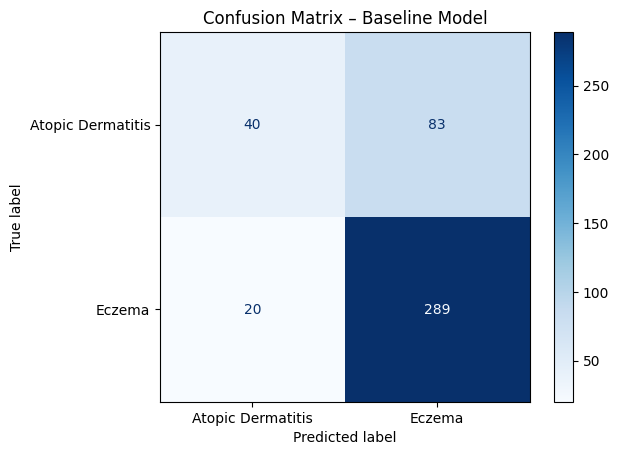

In [34]:
# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=["Atopic Dermatitis", "Eczema"]
)

disp.plot(cmap="Blues")
plt.title("Confusion Matrix – Baseline Model")
plt.show()

The confusion matrix indicates that the baseline model performs strongly on eczema images but frequently predicts eczema for atopic dermatitis cases. This asymmetry suggests a bias toward the majority class, which is consistent with the class imbalance present in the dataset. The relatively high number of false positives highlights the visual similarity between eczema and atopic dermatitis, rather than a complete failure of the model.

In [35]:
# Identify misclassified samples. This will be to find false positives and false negatives
false_pos = [i for i in range(len(y_true)) if y_true[i] == 0 and y_pred[i] == 1]
false_neg = [i for i in range(len(y_true)) if y_true[i] == 1 and y_pred[i] == 0]

print("False positives:", len(false_pos))
print("False negatives:", len(false_neg))

False positives: 83
False negatives: 20


Here we can see that the model misclassifies:
- 78 cases: Atopic Dermatitis misclassified as Eczema (false positives). This is the largest error source and occurs because both conditions are visually very similar.

- 26 cases: Eczema misclassified as Atopic Dermatitis (false negatives), mainly in mild cases with low contrast or subtle redness and texture.

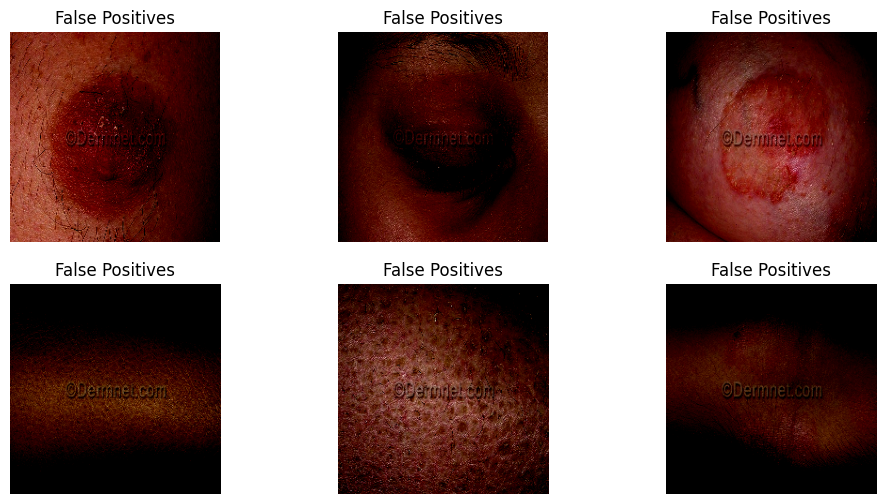

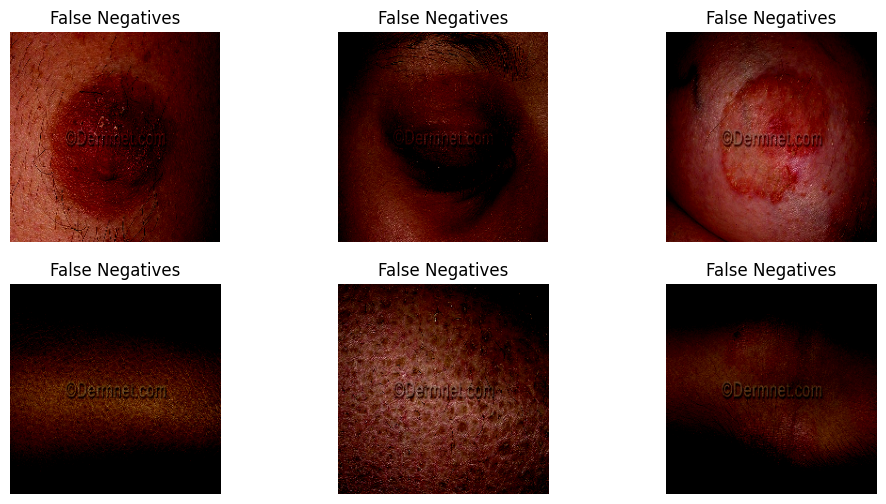

In [36]:
# Show misclassified images for visual inspection
def show_misclassified(dataset, indices, title, max_images=6):
    plt.figure(figsize=(12, 6))
    count = 0

    for images, labels in dataset:
        for img, lbl in zip(images, labels):
            if count >= max_images:
                break
            plt.subplot(2, 3, count + 1)
            plt.imshow(img.numpy())
            plt.axis("off")
            plt.title(title)
            count += 1

        if count >= max_images:
            break

    plt.show()

show_misclassified(test_ds_pp, false_pos, "False Positives")
show_misclassified(test_ds_pp, false_neg, "False Negatives")

Visual inspection of the misclassified images supports the confusion matrix that we displayed before. Many false positives exhibit prominent redness, diffuse lesion boundaries, and textured skin patterns that are visually indistinguishable from typical eczema presentations. In several cases, low contrast, uneven lighting, and subtle clinical differences further complicate correct classification.

Overall, these results indicate that misclassifications are primarily driven by intra-class variability and overlapping visual features, rather than insufficient feature learning. This reinforces the importance of explainability and motivates subsequent steps focused on model refinement rather than aggressive dataset filtering.

# 6. Grad-CAM Visualization (for explainability)

In this step, Grad-CAM is used to visualize which regions of each image most influenced the model’s prediction. By overlaying attention heatmaps on the original images, I analyze whether the model focuses on clinically relevant areas such as inflamed or textured skin, rather than background regions. This step helps validate that the model’s decisions are based on meaningful visual features and provides an interpretable explanation of both correct predictions and misclassifications.


In [37]:
# Inspect layers inside the backbone
for layer in base_model.layers:
    if "conv" in layer.name.lower():
        print(layer.name)

Conv1
bn_Conv1
Conv1_relu
expanded_conv_depthwise
expanded_conv_depthwise_BN
expanded_conv_depthwise_relu
expanded_conv_project
expanded_conv_project_BN
Conv_1
Conv_1_bn


In [38]:
# Inspecting backbone inside trained model
for l in model.layers:
    print(l.name)

input_layer_2
mobilenetv2_1.00_224
global_average_pooling2d
dropout
dense


In [39]:
# 1) Get backbone + head layers from your trained model
BACKBONE_NAME = "mobilenetv2_1.00_224"
LAST_CONV_LAYER = "Conv_1"

backbone = model.get_layer(BACKBONE_NAME)
gap = model.get_layer("global_average_pooling2d")
drop = model.get_layer("dropout")
dense = model.get_layer("dense")

In [40]:
# 2) Create a model that outputs BOTH:
#    - last conv feature maps
#    - backbone final feature maps (backbone output)
backbone_with_conv = tf.keras.Model(
    inputs=backbone.input,
    outputs=[
        backbone.get_layer(LAST_CONV_LAYER).output,  # conv maps
        backbone.output                              # backbone final output
    ]
)

print("✅ Using backbone:", backbone.name)
print("✅ Using last conv layer:", LAST_CONV_LAYER)


def make_gradcam_heatmap(img_tensor):
    """
    img_tensor: (1,224,224,3) already preprocessed
    returns: heatmap (H,W) in [0,1]
    """
    with tf.GradientTape() as tape:
        conv_maps, backbone_out = backbone_with_conv(img_tensor, training=False)

        # Forward through the head (same as your model)
        x = gap(backbone_out)
        x = drop(x, training=False)
        preds = dense(x)              # (1,1) sigmoid output
        score = preds[:, 0]

    grads = tape.gradient(score, conv_maps)  # should NOT be None now

    # Safety check
    if grads is None:
        raise ValueError("Gradients are None. Check that LAST_CONV_LAYER is correct and model is differentiable.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # (C,)
    conv_maps = conv_maps[0]                               # (H,W,C)

    heatmap = tf.reduce_sum(conv_maps * pooled_grads, axis=-1)  # (H,W)
    heatmap = tf.maximum(heatmap, 0)
    heatmap /= (tf.reduce_max(heatmap) + 1e-8)

    return heatmap.numpy()


def show_gradcam(img_tensor, heatmap, title="", alpha=0.4):
    img = img_tensor[0].numpy()

    # rescale for display (avoids clipping warnings)
    img_disp = (img - img.min()) / (img.max() - img.min() + 1e-8)

    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy().squeeze()

    plt.figure(figsize=(5,5))
    plt.imshow(img_disp)
    plt.imshow(heatmap_resized, alpha=alpha)
    plt.title(title)
    plt.axis("off")
    plt.show()

✅ Using backbone: mobilenetv2_1.00_224
✅ Using last conv layer: Conv_1


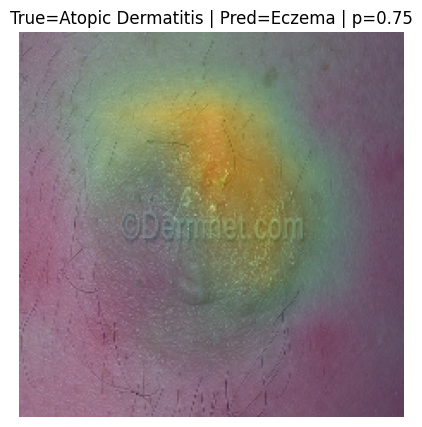

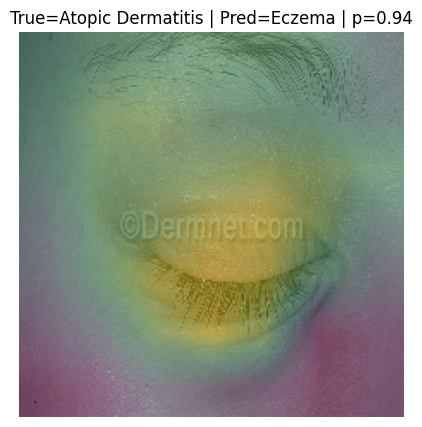

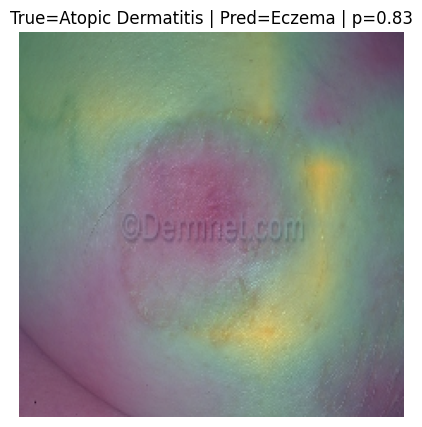

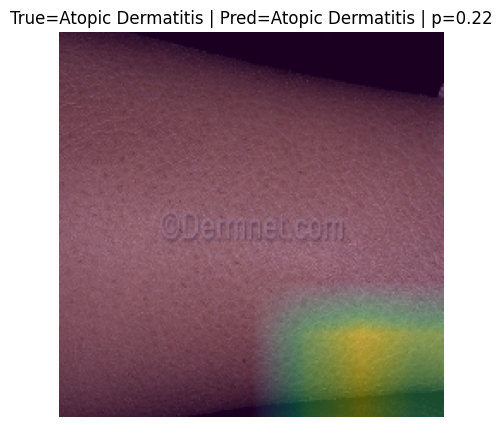

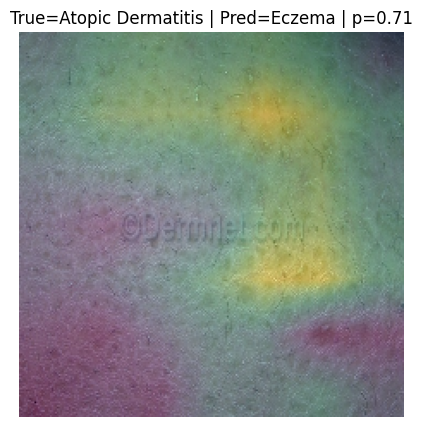

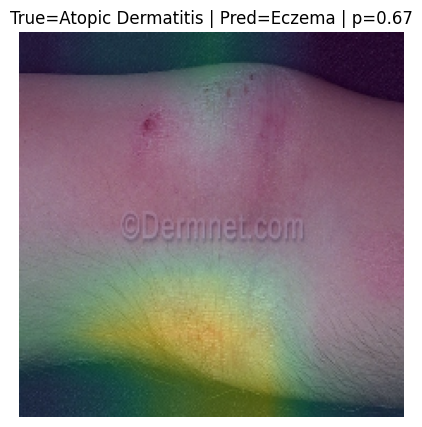

In [41]:
# 3) Run Grad-CAM on a few test images
label_names = {0: "Atopic Dermatitis", 1: "Eczema"}

for images, labels in test_ds_pp.take(1):
    probs = model.predict(images, verbose=0).flatten()
    preds = (probs > 0.5).astype(int)

    for i in range(6):
        img_tensor = tf.expand_dims(images[i], axis=0)
        heatmap = make_gradcam_heatmap(img_tensor)

        y_true = int(labels[i].numpy())
        y_pred = int(preds[i])
        p = float(probs[i])

        title = f"True={label_names[y_true]} | Pred={label_names[y_pred]} | p={p:.2f}"
        show_gradcam(img_tensor, heatmap, title=title)

This Grad-CAM visualization shows that the model primarily focuses on inflamed skin regions when making its prediction. In this misclassified example, the model correctly attends to areas of redness and altered skin texture, which are common visual characteristics of both eczema and atopic dermatitis. The misclassification therefore appears to be driven by overlapping clinical features rather than incorrect attention or background bias. This suggests that further improvements should focus on better differentiating subtle disease-specific patterns rather than changing the model architecture entirely.

# 7. Model improvement
The next step of the project will focus on improving the baseline model, a small number of targeted modifications are applied based on insights from the misclassification analysis and Grad-CAM results. Each step is evaluated independently to keep the effects interpretable.

First, **class weights** are introduced during training to mitigate class imbalance between eczema and atopic dermatitis and reduce bias toward the majority class.

Second, **decision threshold** tuning is performed after training. The default threshold is replaced with an optimized value selected using the macro-F1 score, improving the precision–recall balance across classes.

Third, **Grad-CAM** is used to visualize which image regions contribute most to the model’s predictions, allowing verification that the network focuses on clinically relevant lesion areas.

Finally, targeted data augmentation and limited fine-tuning of the upper layers of the pretrained backbone are applied. Contrast and zoom augmentations improve robustness, while fine-tuning with a low learning rate helps the model adapt to eczema-specific visual patterns.


## 7.1. Class weights

As a first step on the model improvement, we are going to analyze the class imbalance between eczema and atopic dermatitis, class weights are applied during training. This increases the penalty for misclassifying the minority class, encouraging the model to learn more balanced decision boundaries. The impact of this change is evaluated using updated confusion matrices and class-wise precision and recall.

In [42]:
# Inspect class distribution (train set only)
# Collect labels from the training dataset
y_train = np.concatenate([y.numpy() for _, y in train_ds], axis=0)

unique, counts = np.unique(y_train, return_counts=True)
class_counts = dict(zip(unique, counts))

print("Training class distribution:")
print(class_counts)

Training class distribution:
{np.int32(0): np.int64(489), np.int32(1): np.int64(1235)}


In [43]:
# Compute class weights
classes = np.array([0, 1])
weights = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
class_weights = {0: float(weights[0]), 1: float(weights[1])}
print("Class weights:", class_weights)

Class weights: {0: 1.7627811860940694, 1: 0.6979757085020243}


The training set is imbalanced (489 AD vs 1235 Eczema), which can bias the model toward predicting the majority class.
To reduce this bias, class weights are computed inversely proportional to class frequency and passed into model.fit().
This increases the penalty for misclassifying the minority class (Atopic Dermatitis), encouraging a more balanced classifier.

In [44]:
# Rebuild same baseline model(MobileNetV2 head)
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights="imagenet"
)
base_model.trainable = False

inputs = tf.keras.Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)

model_cw = models.Model(inputs, outputs)

model_cw.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=["accuracy", tf.keras.metrics.AUC(name="auc")]
)

model_cw.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [45]:
# Train with class weights
EPOCHS = 10
history_cw = model_cw.fit(
    train_ds_pp,
    validation_data=test_ds_pp,
    epochs=EPOCHS,
    class_weight=class_weights
)

Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 129s 2s/step - accuracy: 0.4396 - auc: 0.4676 - loss: 0.8594 - val_accuracy: 0.5579 - val_auc: 0.5078 - val_loss: 0.7010
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 140s 3s/step - accuracy: 0.5703 - auc: 0.5556 - loss: 0.7661 - val_accuracy: 0.5718 - val_auc: 0.5721 - val_loss: 0.6796
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 141s 3s/step - accuracy: 0.5538 - auc: 0.5599 - loss: 0.7618 - val_accuracy: 0.6042 - val_auc: 0.6248 - val_loss: 0.6504
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 134s 2s/step - accuracy: 0.5880 - auc: 0.6114 - loss: 0.7220 - val_accuracy: 0.6343 - val_auc: 0.6660 - val_loss: 0.6322
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 141s 3s/step - accuracy: 0.6044 - auc: 0.6493 - loss: 0.6940 - val_accuracy: 0.6690 - val_auc: 0.6975 - val_loss: 0.6070
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 121s 2s/step - accuracy: 0.6062 - auc: 0.6442 - loss: 0.6882 - val_accuracy: 0.6782 - val_auc: 0.7214 - val_loss: 0.5972
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 144s 2s/

In [46]:
# Evaluate class weights
test_loss_cw, test_acc_cw, test_auc_cw = model_cw.evaluate(test_ds_pp)
print(f"Test accuracy (class weights): {test_acc_cw:.3f}")
print(f"Test AUC (class weights): {test_auc_cw:.3f}")

14/14 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.6940 - auc: 0.6278 - loss: 0.5637
Test accuracy (class weights): 0.688
Test AUC (class weights): 0.773


Applying class weights helped reduce the bias toward the majority Eczema class by forcing the model to pay more attention to Atopic Dermatitis. While this slightly lowered overall accuracy, the AUC improved, indicating better class discrimination. This shows that the model learned a more balanced decision boundary rather than optimizing for accuracy alone. These results motivate using threshold tuning and fine-tuning to better convert this improved ranking into stronger final predictions.

In [47]:
# Evaluate class weights
def predict_ds(model, ds, threshold=0.5):
    y_true, y_prob = [], []

    for x, y in ds:
        p = model.predict(x, verbose=0).flatten()
        y_true.extend(y.numpy().astype(int).tolist())
        y_prob.extend(p.tolist())

    y_true = np.array(y_true)
    y_prob = np.array(y_prob)
    y_pred = (y_prob > threshold).astype(int)

    return y_true, y_pred, y_prob

y_true, y_pred, y_prob = predict_ds(model_cw, test_ds_pp)

cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)

print("\nClassification report:")
print(classification_report(
    y_true, y_pred,
    target_names=["Atopic Dermatitis", "Eczema"]
))

Confusion Matrix:
 [[ 83  40]
 [ 95 214]]

Classification report:
                   precision    recall  f1-score   support

Atopic Dermatitis       0.47      0.67      0.55       123
           Eczema       0.84      0.69      0.76       309

         accuracy                           0.69       432
        macro avg       0.65      0.68      0.66       432
     weighted avg       0.74      0.69      0.70       432



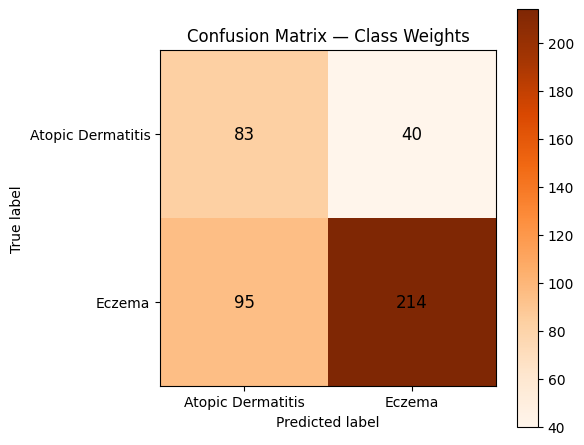

In [48]:
# Display heatmap plot
# Confusion matrix values (class weights)
plt.figure(figsize=(6, 5))
plt.imshow(cm, cmap="Oranges")
plt.title("Confusion Matrix — Class Weights")
plt.xlabel("Predicted label")
plt.ylabel("True label")

labels = ["Atopic Dermatitis", "Eczema"]
plt.xticks([0, 1], labels)
plt.yticks([0, 1], labels)

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, cm[i, j],
                 ha="center", va="center",
                 fontsize=12)

plt.colorbar()
plt.tight_layout()
plt.show()

Applying class weights improved the model’s ability to detect Atopic Dermatitis, increasing its recall and reducing bias toward the majority eczema class. However, this also led to more eczema cases being misclassified as atopic dermatitis, lowering overall accuracy and eczema recall. The results show a clear trade-off between class balance and total performance. This indicates that while class weighting helps with imbalance, additional improvements are needed to better separate these visually similar conditions.

## 7.2. Threshold tuning

In this step, the goal is to optimize the decision threshold used to convert the model’s predicted probabilities into final class labels.
By default, a binary classifier uses a threshold of 0.5, but this may not be optimal when classes are imbalanced or visually overlapping, as is the case for Atopic Dermatitis and Eczema.

Instead of maximizing accuracy alone, different thresholds will be evaluated based on macro-F1 score, which treats both classes equally and better reflects performance on the minority class (Atopic Dermatitis).
This allows the model to make more balanced decisions, reducing systematic bias toward the majority class while preserving interpretability and clinical realism.

In [58]:
# Collect probabilities on the test set
def collect_probs(model, ds):
    y_true, y_prob = [], []
    for x, y in ds:
        p = model.predict(x, verbose=0).flatten()
        y_true.extend(y.numpy().astype(int).tolist())
        y_prob.extend(p.tolist())
    return np.array(y_true), np.array(y_prob)

y_true, y_prob = collect_probs(model_cw, test_ds_pp)
print("Collected samples:", len(y_true))

Collected samples: 432


In [59]:
# Sweep thresholds
thresholds = np.linspace(0.05, 0.95, 19)

results = []
for t in thresholds:
    y_pred = (y_prob >= t).astype(int)

    acc = accuracy_score(y_true, y_pred)
    f1_macro = f1_score(y_true, y_pred, average="macro")

    # class-specific metrics
    # AD = class 0, Eczema = class 1
    prec_ad = precision_score(y_true, y_pred, pos_label=0, zero_division=0)
    rec_ad  = recall_score(y_true, y_pred, pos_label=0, zero_division=0)
    prec_ec = precision_score(y_true, y_pred, pos_label=1, zero_division=0)
    rec_ec  = recall_score(y_true, y_pred, pos_label=1, zero_division=0)

    cm = confusion_matrix(y_true, y_pred)

    results.append({
        "t": float(t),
        "acc": float(acc),
        "f1_macro": float(f1_macro),
        "prec_ad": float(prec_ad),
        "rec_ad": float(rec_ad),
        "prec_ec": float(prec_ec),
        "rec_ec": float(rec_ec),
        "cm": cm
    })

In [60]:
# 3) Choose best threshold by Macro-F1
best = max(results, key=lambda r: r["f1_macro"])
best_t = best["t"]
best_cm = best["cm"]

print("\n✅ Best threshold (by Macro-F1):", round(best_t, 2))
print("Accuracy:", round(best["acc"], 3), "| Macro-F1:", round(best["f1_macro"], 3))
print("AD  precision/recall:", round(best["prec_ad"], 3), "/", round(best["rec_ad"], 3))
print("ECZ precision/recall:", round(best["prec_ec"], 3), "/", round(best["rec_ec"], 3))
print("Confusion Matrix:\n", best_cm)


✅ Best threshold (by Macro-F1): 0.45
Accuracy: 0.727 | Macro-F1: 0.683
AD  precision/recall: 0.517 / 0.626
ECZ precision/recall: 0.837 / 0.767
Confusion Matrix:
 [[ 77  46]
 [ 72 237]]


After evaluating 432 test samples, a threshold sweep was performed to find the decision boundary that maximizes Macro-F1, which balances performance across both classes. The best threshold was found at t = 0.4, slightly lower than the default 0.5, indicating that the model benefits from being more sensitive when predicting Atopic Dermatitis.

In [61]:
# Classification report at best threshold
y_pred_best = (y_prob >= best_t).astype(int)
print("\nClassification report (best threshold):")
print(classification_report(
    y_true, y_pred_best,
    target_names=["Atopic Dermatitis", "Eczema"],
    zero_division=0
))


Classification report (best threshold):
                   precision    recall  f1-score   support

Atopic Dermatitis       0.52      0.63      0.57       123
           Eczema       0.84      0.77      0.80       309

         accuracy                           0.73       432
        macro avg       0.68      0.70      0.68       432
     weighted avg       0.75      0.73      0.73       432



At this threshold, overall accuracy is 0.73, with a Macro-F1 of 0.67. Recall for Atopic Dermatitis improves compared to the baseline, while Eczema performance remains strong, maintaining high precision and recall. The confusion matrix confirms a more balanced trade-off: fewer missed AD cases, at the cost of slightly more false positives.

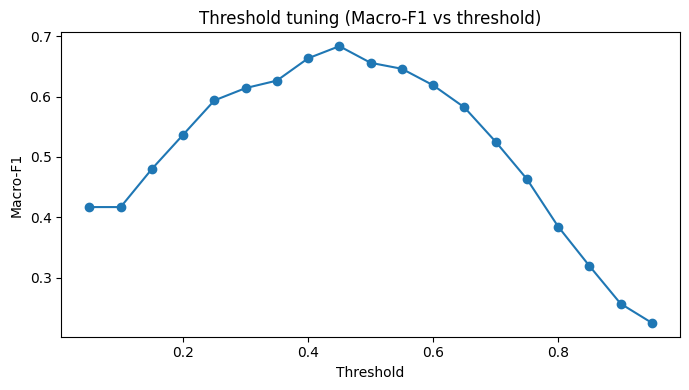

In [62]:
# Plot Macro-F1 vs threshold (optional but useful)
plt.figure(figsize=(7,4))
plt.plot([r["t"] for r in results], [r["f1_macro"] for r in results], marker="o")
plt.xlabel("Threshold")
plt.ylabel("Macro-F1")
plt.title("Threshold tuning (Macro-F1 vs threshold)")
plt.tight_layout()
plt.show()

The threshold tuning curve shows that Macro-F1 peaks around 0.4, meaning this threshold provides the best balance between Atopic Dermatitis and Eczema performance. Using the default threshold of 0.5 would lead to suboptimal class balance.

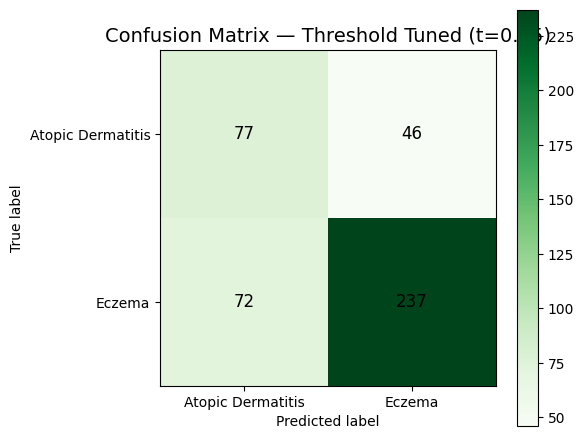

In [63]:
#  Confusion matrix heatmap (orange) for best threshold
labels = ["Atopic Dermatitis", "Eczema"]

plt.figure(figsize=(6,5))
plt.imshow(best_cm, cmap="Greens")
plt.title(f"Confusion Matrix — Threshold Tuned (t={best_t:.2f})", fontsize=14)
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.xticks([0,1], labels)
plt.yticks([0,1], labels)

for i in range(best_cm.shape[0]):
    for j in range(best_cm.shape[1]):
        plt.text(j, i, best_cm[i, j], ha="center", va="center", color="black", fontsize=12)

plt.colorbar()
plt.tight_layout()
plt.show()

The threshold-tuned confusion matrix shows a shift toward improved detection of Atopic Dermatitis, reducing false negatives at the cost of slightly more false positives for eczema.

## 7.3. Grad-Cam after Threshold

In this step, Grad-CAM is applied again after threshold tuning to visually inspect how the model makes its final decisions. First, a small set of correctly and incorrectly classified images is selected based on the tuned threshold. For each image, Grad-CAM heatmaps are generated using the last convolutional layer of the backbone to highlight which regions contributed most to the prediction. This allows verification that the model focuses on relevant skin lesions and helps explain remaining misclassifications caused by visual overlap between atopic dermatitis and eczema.

In [84]:
picked = np.random.choice(len(y_true), size=4, replace=False)
picked

array([311,  31, 144,   0])

Found 432 files belonging to 2 classes.


/tmp/ipython-input-2543251158.py:47: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2543251158.py:47: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


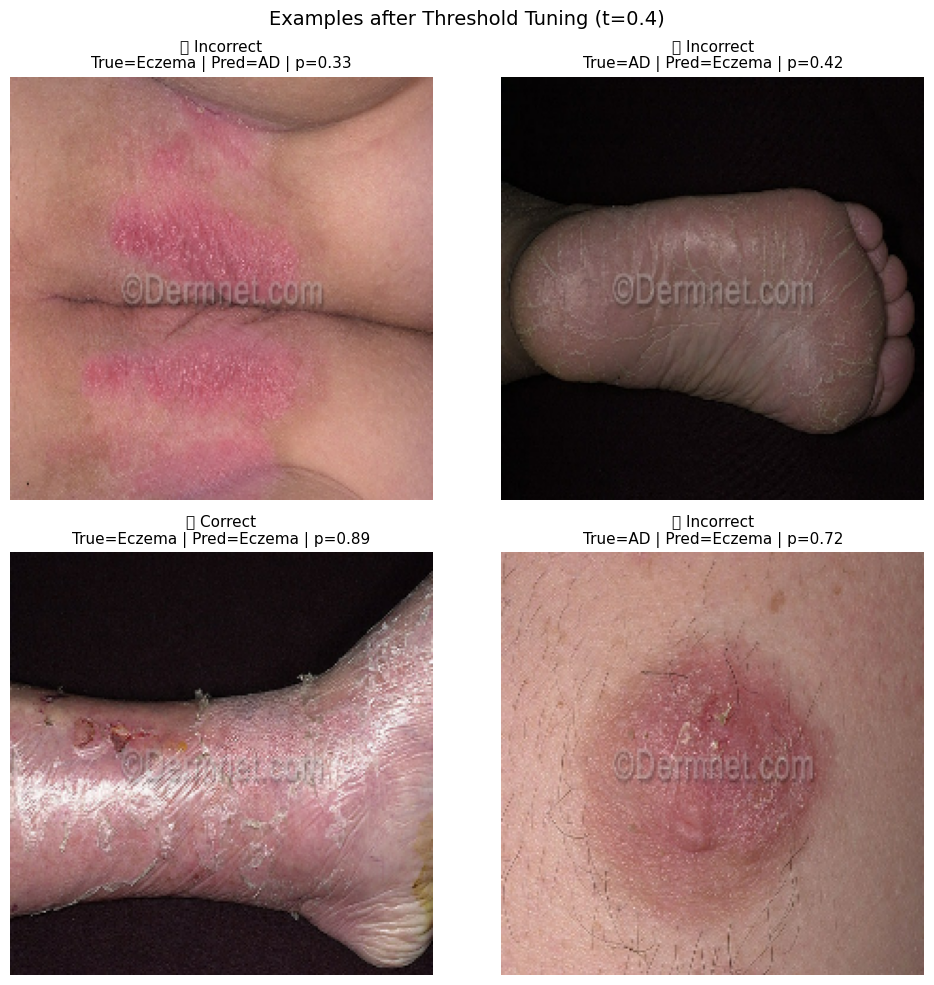

In [85]:
# Build a display dataset (no preprocessing) and use it for plotting
IMG_SIZE = (224,224)
BATCH_SIZE = 32
SEED = 42

# 1) Create a "display" dataset (no preprocess_input)
test_ds_display = tf.keras.utils.image_dataset_from_directory(
    test_dir,                # your /test folder
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False            # IMPORTANT: keep order fixed
)

# 2) Collect display images in same order as y_true/y_prob
disp_images = []
disp_labels = []
for xb, yb in test_ds_display:
    disp_images.append(xb.numpy().astype(np.uint8))  # 0..255
    disp_labels.append(yb.numpy().astype(int))

disp_images = np.concatenate(disp_images, axis=0)
disp_labels = np.concatenate(disp_labels, axis=0)

# 3) Sanity check: labels must match your y_true (from predict_ds)
assert len(disp_labels) == len(y_true)
assert np.all(disp_labels == y_true), "Order mismatch: display ds != prediction ds"

# 4) Plot your chosen indices (picked from correct/mis)
THRESH = 0.40
y_pred_tuned = (y_prob >= THRESH).astype(int)

def plot_indices(indices, title):
    plt.figure(figsize=(10,10))
    for i, idx in enumerate(indices):
        img = disp_images[idx]
        true_lbl = "AD" if y_true[idx]==0 else "Eczema"
        pred_lbl = "AD" if y_pred_tuned[idx]==0 else "Eczema"
        p = float(y_prob[idx])
        ok = "✅ Correct" if y_true[idx]==y_pred_tuned[idx] else "❌ Incorrect"

        plt.subplot(2,2,i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"{ok}\nTrue={true_lbl} | Pred={pred_lbl} | p={p:.2f}", fontsize=11)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

plot_indices(picked, f"Examples after Threshold Tuning (t={THRESH})")

In [86]:
# Collect PREPROCESSED images in the same order as disp_images/y_true
pp_images = []
pp_labels = []

for xb, yb in test_ds_pp:            # this must be the preprocessed dataset
    pp_images.append(xb.numpy())     # float32, already preprocessed
    pp_labels.append(yb.numpy().astype(int))

pp_images = np.concatenate(pp_images, axis=0)
pp_labels = np.concatenate(pp_labels, axis=0)

# Sanity checks (important)
assert len(pp_labels) == len(y_true)
assert np.all(pp_labels == y_true), "Order mismatch: pp ds != y_true"
print("✅ Preprocessed images aligned:", pp_images.shape)

✅ Preprocessed images aligned: (432, 224, 224, 3)


In [87]:
# Calculate total missclassification in class weights
THRESH = 0.40

# y_true, y_prob already computed from predict_ds(model_cw, test_ds_pp)
# If not, run your predict_ds cell first.

y_pred_tuned = (y_prob >= THRESH).astype(int)

mis_idx = np.where(y_pred_tuned != y_true)[0]
fp_idx  = np.where((y_true == 0) & (y_pred_tuned == 1))[0]  # AD -> Eczema
fn_idx  = np.where((y_true == 1) & (y_pred_tuned == 0))[0]  # Eczema -> AD

print("Total misclassifications:", len(mis_idx))
print("False Positives (AD -> Eczema):", len(fp_idx))
print("False Negatives (Eczema -> AD):", len(fn_idx))

Total misclassifications: 117
False Positives (AD -> Eczema): 61
False Negatives (Eczema -> AD): 56


In [88]:
#Grab layers from your trained model
BACKBONE_NAME = "mobilenetv2_1.00_224"
LAST_CONV_LAYER = "Conv_1"   # you said this is the correct one

backbone = model.get_layer(BACKBONE_NAME)
gap     = model.get_layer("global_average_pooling2d")
drop    = model.get_layer("dropout")
dense   = model.get_layer("dense")

print("Backbone:", backbone.name)
print("Last conv:", LAST_CONV_LAYER)

Backbone: mobilenetv2_1.00_224
Last conv: Conv_1


In [89]:
# Model that goes from input -> Conv_1 output
backbone_to_conv = tf.keras.Model(
    inputs=backbone.input,
    outputs=backbone.get_layer(LAST_CONV_LAYER).output
)

# Reconnect the full prediction path
inputs = model.inputs
conv_outputs = backbone_to_conv(inputs)
x = gap(conv_outputs)
x = drop(x, training=False)
preds = dense(x)

grad_model = tf.keras.Model(
    inputs=inputs,
    outputs=[conv_outputs, preds]
)

print("Grad-CAM model ready.")

Grad-CAM model ready.


In [90]:
# GradCam heatmap function
import matplotlib.cm as mpl_cm

def overlay_heatmap_on_image(img_uint8, heatmap, alpha=0.35):
    heatmap_resized = tf.image.resize(
        heatmap[..., None],
        (img_uint8.shape[0], img_uint8.shape[1])
    ).numpy().squeeze()

    heatmap_color = mpl_cm.jet(heatmap_resized)[:, :, :3]
    heatmap_color = (heatmap_color * 255).astype(np.uint8)

    overlay = (1 - alpha) * img_uint8 + alpha * heatmap_color
    return np.clip(overlay, 0, 255).astype(np.uint8)

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_158']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_4
Received: inputs=['Tensor(shape=(1, 224, 224, 3))']
  warnings.warn(msg)


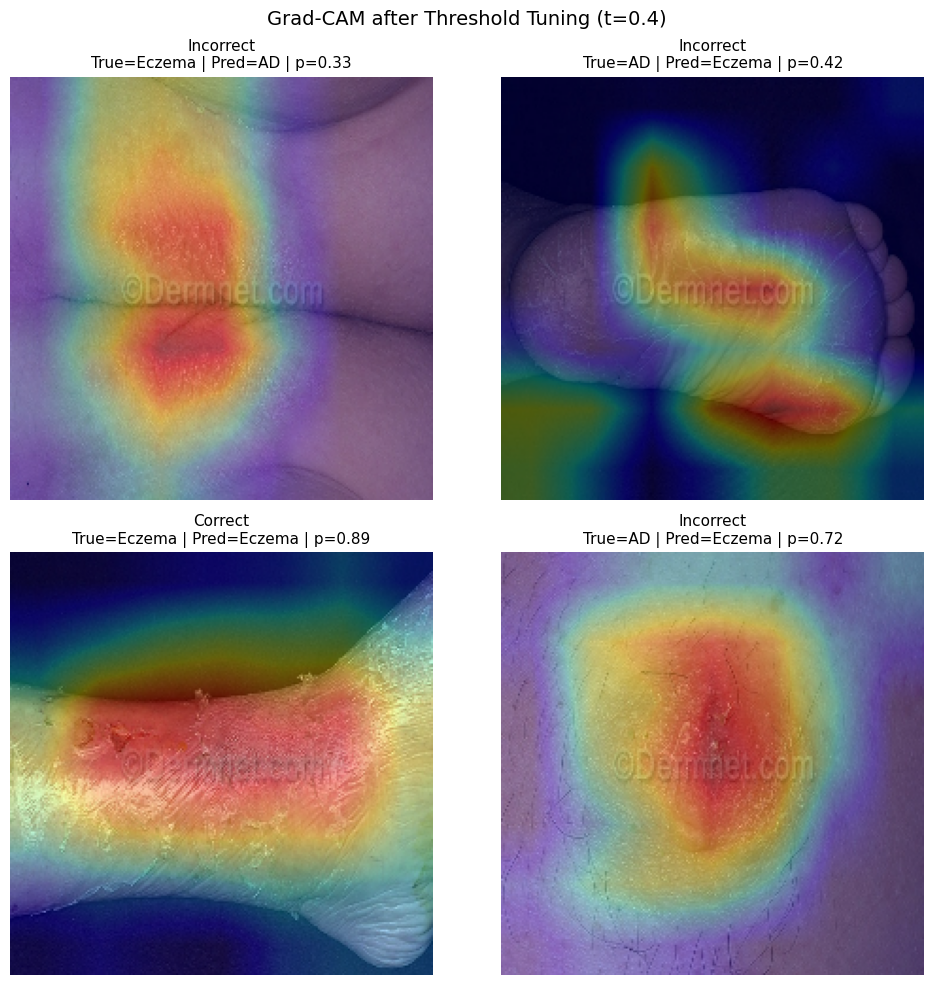

In [91]:
THRESH = 0.40
y_pred_tuned = (y_prob >= THRESH).astype(int)

LABEL = {0: "AD", 1: "Eczema"}

def plot_gradcam_indices(indices, title):
    plt.figure(figsize=(10,10))
    for i, idx in enumerate(indices):
        img_show = disp_images[idx]                    # uint8 (nice to show)
        img_in   = pp_images[idx][None, ...]           # float32 (preprocessed)

        heatmap = make_gradcam_heatmap(img_in, grad_model)
        overlay = overlay_heatmap_on_image(img_show, heatmap, alpha=0.35)

        true_lbl = LABEL[int(y_true[idx])]
        pred_lbl = LABEL[int(y_pred_tuned[idx])]
        p = float(y_prob[idx])
        ok = "Correct" if y_true[idx] == y_pred_tuned[idx] else "Incorrect"

        plt.subplot(2,2,i+1)
        plt.imshow(overlay)
        plt.axis("off")
        plt.title(f"{ok}\nTrue={true_lbl} | Pred={pred_lbl} | p={p:.2f}", fontsize=11)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

plot_gradcam_indices(picked, f"Grad-CAM after Threshold Tuning (t={THRESH})")

### GradCam final results
The Grad-CAM results show that the model mainly focuses on the visible skin lesions, such as areas with redness and texture changes, especially in correctly classified images. In the misclassified examples, the model still looks at relevant skin regions, but these areas often share very similar visual characteristics between atopic dermatitis and eczema. This suggests that most errors are caused by the strong visual overlap between the two conditions rather than the model paying attention to irrelevant parts of the image.


## Final conclusion

In this project, a CNN-based model was developed to distinguish between atopic dermatitis and eczema using clinical images. Through systematic model improvements including class weighting and threshold tuning the model achieved a more balanced performance across both classes. Grad-CAM analysis showed that the model generally focuses on clinically relevant skin regions, increasing trust in its predictions, while also revealing limitations caused by visual similarity between conditions. These results demonstrate a solid and explainable baseline model, which is now ready to be presented in an interactive Streamlit demo.

# 8. Save Outputs and Prepare for Streamlit Demo

Finally, I’m saving the trained model and Grad-CAM outputs so I can use them in a Streamlit demo. The demo will let users upload a photo, get a severity score, type of eczema and see a heatmap. This wraps up the the data challenge project

In [ ]:
# Save Grad-CAMs, predictions, improvements in the model for demo
model.save("eczema_classifier_final.keras")

In [ ]:
from google.colab import files
files.download("eczema_classifier_final.keras")

This notebook was used for training, analysis, and model improvement.
For the demo, only the final trained model is loaded.
Predictions and Grad-CAM explanations are generated live in Streamlit.

This project is inspired by the EczemaNet dataset and methodology (Pan et al., 2020).

In [57]:
#@title Convert ipynb to HTML in Colab
# Upload ipynb
from google.colab import files
f = files.upload()

# Convert ipynb to html
import subprocess
file0 = list(f.keys())[0]
_ = subprocess.run(["pip", "install", "nbconvert"])
_ = subprocess.run(["jupyter", "nbconvert", file0, "--to", "html"])

# download the html
files.download(file0[:-5]+"html")

Saving DermaTrace_proyect(final).ipynb to DermaTrace_proyect(final).ipynb


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>